https://jwst-docs.stsci.edu/jwst-near-infrared-spectrograph/nirspec-observing-strategies/nirspec-msata-reference-star-selection-recommended-strategies

need ~25 reference objects over the entire MSA, of which ~25% will likely be usable, yielding the ~6 we need.

In [1]:
#%matplotlib inline
%matplotlib notebook
import matplotlib.pyplot as plt

In [2]:
import os
import numpy as np
from glob import glob
from os.path import join
from os.path import expanduser
home = expanduser("~")

#from astropy.io import ascii
import astropy
from astropy.table import Table, vstack
import astropy.units as u

In [3]:
from PIL import Image, ImageEnhance
import PIL
PIL.Image.MAX_IMAGE_PIXELS = 933120000  # avoid decompression bomb error when loading large images

In [4]:
def roundint(x):
    return int(np.round(x))

def between(lo, x, hi):
    return (lo < x) * (x < hi)

# not detected: mag =  99; magerr = 1-sigma upper limit assuming zero flux
# not observed: mag = -99; magerr = 0
def fluxes2mags(flux, fluxerr):
    nondet = flux < 0  # Non-detection if flux is negative
    unobs = (fluxerr <= 0) + (fluxerr == np.inf)  # Unobserved if flux uncertainty is negative or infinity

    mag = flux.to(u.ABmag)
    magupperlimit = fluxerr.to(u.ABmag) # 1-sigma upper limit if flux=0

    mag = np.where(nondet, 99 * u.ABmag, mag)
    mag = np.where(unobs, -99 * u.ABmag, mag)

    magerr = 2.5 * np.log10(1 + fluxerr/flux) 
    magerr = magerr.value * u.ABmag

    magerr = np.where(nondet, magupperlimit, magerr)
    magerr = np.where(unobs, 0 * u.ABmag, magerr)
    
    return mag, magerr

def extract_id(cat, id, idlabel='id'):
    # Note input id must be same format as cat[idlabel] (int or string)
    # to create an array with mostly False entries and True for id
    # cat['id'] dtype='int64'
    # cat['id'] == 3: [False, False, True, False...]
    # cat['id'] == '3': False
    #
    # obj:          astropy.table.table.Table
    # obj[0]:       astropy.table.row.Row
    # obj['id']:    astropy.table.column.Column
    # obj[0]['id']: numpy.int64
    duck_duck_goose = cat[idlabel] == int(id)
    if len(duck_duck_goose):
        obj = cat[duck_duck_goose]
    return obj[0]

In [5]:
field = 'whl0137'
indir = '../eazy_v4'
infile = field + '_phot-eazy.ecsv'
infile = os.path.join(indir, infile)

catalog = astropy.io.ascii.read(infile)

In [6]:
# Reconstitute filters
filters = []
for label in catalog.columns:
    if label.endswith('_flux'):
        filters.append(label[:-5])
        
#filters

In [7]:
# flux -> mag

flux_units = u.uJy

for filt in filters:
    label = filt + '_flux'
    flux = catalog[filt+'_flux']
    fluxerr = catalog[filt+'_fluxerr']
    #flux = flux.to(u.uJy).value
    #fluxerr = fluxerr.to(u.uJy).value
    nan_flux = np.isnan(flux)
    flux = np.where(nan_flux, 0, flux)
    fluxerr = np.where(nan_flux, 1e30, fluxerr)
    mag, magerr = fluxes2mags(flux * flux_units, fluxerr * flux_units)
    #mag, magerr = fluxes2mags(flux, fluxerr)
    #cat[filt+'_flux'] = flux
    #cat[filt+'_fluxerr'] = fluxerr
    catalog[filt+'_mag'] = mag.value
    catalog[filt+'_magerr'] = magerr.value

/Users/dcoe/miniconda3/envs/erophot/lib/python3.10/site-packages/astropy/units/function/logarithmic.py:47: RuntimeWarning: invalid value encountered in log10
  return dex.to(self._function_unit, np.log10(x))
/Users/dcoe/miniconda3/envs/erophot/lib/python3.10/site-packages/astropy/units/quantity.py:611: RuntimeWarning: invalid value encountered in log10
  result = super().__array_ufunc__(function, method, *arrays, **kwargs)


In [8]:
catalog[:2]

id,ra,dec,f090w_flux,f090w_fluxerr,f105w_flux,f105w_fluxerr,f110w_flux,f110w_fluxerr,f115w_flux,f115w_fluxerr,f125w_flux,f125w_fluxerr,f140w_flux,f140w_fluxerr,f150w_flux,f150w_fluxerr,f160w_flux,f160w_fluxerr,f200w_flux,f200w_fluxerr,f277w_flux,f277w_fluxerr,f356w_flux,f356w_fluxerr,f410m_flux,f410m_fluxerr,f435w_flux,f435w_fluxerr,f444w_flux,f444w_fluxerr,f475w_flux,f475w_fluxerr,f606w_flux,f606w_fluxerr,f814w_flux,f814w_fluxerr,z_spec,nusefilt,z_ml,z_ml_chi2,z_ml_risk,lc_min,lc_max,z_phot,z_phot_chi2,z_phot_risk,z_min_risk,min_risk,z_raw_chi2,raw_chi2,z025,z160,z500,z840,z975,restU,restU_err,restB,restB_err,restV,restV_err,restJ,restJ_err,dL,mass,sfr,Lv,LIR,energy_abs,Lu,Lj,L1400,L2800,LHa,LOIII,LHb,LOII,MLv,Av,lwAgeV,mass_p,sfr_p,Lv_p,LIR_p,energy_abs_p,Lu_p,Lj_p,L1400_p,L2800_p,LHa_p,LOIII_p,LHb_p,LOII_p,Av_p,ssfr_p,rest120,rest120_err,rest121,rest121_err,rest414,rest414_err,rest415,rest415_err,rest416,rest416_err,flux,peak,flux_radius,f090w_mag,f090w_magerr,f105w_mag,f105w_magerr,f110w_mag,f110w_magerr,f115w_mag,f115w_magerr,f125w_mag,f125w_magerr,f140w_mag,f140w_magerr,f150w_mag,f150w_magerr,f160w_mag,f160w_magerr,f200w_mag,f200w_magerr,f277w_mag,f277w_magerr,f356w_mag,f356w_magerr,f410m_mag,f410m_magerr,f435w_mag,f435w_magerr,f444w_mag,f444w_magerr,f475w_mag,f475w_magerr,f606w_mag,f606w_magerr,f814w_mag,f814w_magerr
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,Mpc,solMass,solMass / yr,solLum,solLum,solLum,solLum,solLum,solLum,solLum,solLum,solLum,solLum,solLum,solMass / solLum,,Gyr,,,,,,,,,,,,,,,,,,,,,,,,,,uJy,uJy,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
int32,float64,float64,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float64,int64,float32,float32,float32,float64,float64,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64[5],float64[5],float64[5],float64[5],float64[5],float64[5],float64[5],float64[5],float64[5],float64[5],float64[5],float64[5],float64[5],float64[5],float64[5],float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float64,float64,float64,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32
1,24.390374,-8.500793,-99.000,-99.000,-99.000,-99.000,-99.000,-99.000,-99.000,-99.000,-99.000,-99.000,-99.000,-99.000,-99.000,-99.000,-99.000,-99.000,-99.000,-99.000,-99.000,-99.000,-99.000,-99.000,-99.000,-99.000,-99.000,-99.000,-99.000,-99.000,-99.000,-99.000,-99.000,-99.000,-99.000,-99.000,-1.0,0,-1.0,-1.0,-1.0,43188281021088.9,0.0,-1.0,-1.0,-1.0,0.01,0.0,0.01,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,-99.000,0.000,-99.000,0.000,-99.000,0.000,-99.000,0.000,0.0e+00,-9.00e+29,-900000000000000046043660025856.000,-9.00e+29,-9.00e+29,-9.00e+29,-9.00e+29,-9.00e+29,-9.00e+29,-9.00e+29,-9.00e+29,-9.00e+29,-9.00e+29,-9.00e+29,-900000000000000046043660025856.00,-900000000000000046043660025856.00,-900000000000000046043660025856.00,-9.00e+29 .. -9.00e+29,-900000000000000046043660025856.000 .. -900000000000000046043660025856.000,-9.00e+29 .. -9.00e+29,-9.00e+29 .. -9.00e+29,-9.00e+29 .. -9.00e+29,-9.00e+29 .. -9.00e+29,-9.00e+29 .. -9.00e+29,-9.00e+29 .. -9.00e+29,-9.00e+29 .. -9.00e+29,-9.00e+29 .. -9.00e+29,-9.00e+29 .. -9.00e+29,-9.00e+29 .. -9.00e+29,-9.00e+29 .. -9.00e+29,-900000000000000046043660025856.00 .. -900000000000000046043660025856.00,-9.00e+29 .. -9.00e+29,-99.000,0.000,-99.000,0.000,-99.0

In [9]:
import astropy.units as u
from astropy.io import ascii
from astropy.io import fits
import astropy.wcs as wcs
from astropy.wcs import WCS
from astropy.coordinates import SkyCoord

In [10]:
image_dir = '../images/grizli_v4/20mas'
image_file = 'sunrise-grizli-v4.0-f200w-clear_drc_sci.fits'
image_file = os.path.join(image_dir, image_file)
hdu = fits.open(image_file)
idata = 0
image_wcs = wcs.WCS(hdu[idata].header, hdu)
image_wcs

WCS Keywords

Number of WCS axes: 2
CTYPE : 'RA---TAN'  'DEC--TAN'  
CRVAL : 24.355  -8.457  
CRPIX : 7142.5  7886.5  
CD1_1 CD1_2  : -5.5555555555555e-06  0.0  
CD2_1 CD2_2  : 0.0  5.5555555555555e-06  
NAXIS : 17600  24000

In [11]:
catalog_coordinates = SkyCoord(ra=catalog['ra']*u.deg, dec=catalog['dec']*u.deg)  # *u.deg
catalog['x'], catalog['y'] = image_wcs.world_to_pixel(catalog_coordinates)
catalog[:2]

id,ra,dec,f090w_flux,f090w_fluxerr,f105w_flux,f105w_fluxerr,f110w_flux,f110w_fluxerr,f115w_flux,f115w_fluxerr,f125w_flux,f125w_fluxerr,f140w_flux,f140w_fluxerr,f150w_flux,f150w_fluxerr,f160w_flux,f160w_fluxerr,f200w_flux,f200w_fluxerr,f277w_flux,f277w_fluxerr,f356w_flux,f356w_fluxerr,f410m_flux,f410m_fluxerr,f435w_flux,f435w_fluxerr,f444w_flux,f444w_fluxerr,f475w_flux,f475w_fluxerr,f606w_flux,f606w_fluxerr,f814w_flux,f814w_fluxerr,z_spec,nusefilt,z_ml,z_ml_chi2,z_ml_risk,lc_min,lc_max,z_phot,z_phot_chi2,z_phot_risk,z_min_risk,min_risk,z_raw_chi2,raw_chi2,z025,z160,z500,z840,z975,restU,restU_err,restB,restB_err,restV,restV_err,restJ,restJ_err,dL,mass,sfr,Lv,LIR,energy_abs,Lu,Lj,L1400,L2800,LHa,LOIII,LHb,LOII,MLv,Av,lwAgeV,mass_p,sfr_p,Lv_p,LIR_p,energy_abs_p,Lu_p,Lj_p,L1400_p,L2800_p,LHa_p,LOIII_p,LHb_p,LOII_p,Av_p,ssfr_p,rest120,rest120_err,rest121,rest121_err,rest414,rest414_err,rest415,rest415_err,rest416,rest416_err,flux,peak,flux_radius,f090w_mag,f090w_magerr,f105w_mag,f105w_magerr,f110w_mag,f110w_magerr,f115w_mag,f115w_magerr,f125w_mag,f125w_magerr,f140w_mag,f140w_magerr,f150w_mag,f150w_magerr,f160w_mag,f160w_magerr,f200w_mag,f200w_magerr,f277w_mag,f277w_magerr,f356w_mag,f356w_magerr,f410m_mag,f410m_magerr,f435w_mag,f435w_magerr,f444w_mag,f444w_magerr,f475w_mag,f475w_magerr,f606w_mag,f606w_magerr,f814w_mag,f814w_magerr,x,y
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,Mpc,solMass,solMass / yr,solLum,solLum,solLum,solLum,solLum,solLum,solLum,solLum,solLum,solLum,solLum,solMass / solLum,,Gyr,,,,,,,,,,,,,,,,,,,,,,,,,,uJy,uJy,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
int32,float64,float64,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float64,int64,float32,float32,float32,float64,float64,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64[5],float64[5],float64[5],float64[5],float64[5],float64[5],float64[5],float64[5],float64[5],float64[5],float64[5],float64[5],float64[5],float64[5],float64[5],float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float64,float64,float64,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float64,float64
1,24.390374,-8.500793,-99.000,-99.000,-99.000,-99.000,-99.000,-99.000,-99.000,-99.000,-99.000,-99.000,-99.000,-99.000,-99.000,-99.000,-99.000,-99.000,-99.000,-99.000,-99.000,-99.000,-99.000,-99.000,-99.000,-99.000,-99.000,-99.000,-99.000,-99.000,-99.000,-99.000,-99.000,-99.000,-99.000,-99.000,-1.0,0,-1.0,-1.0,-1.0,43188281021088.9,0.0,-1.0,-1.0,-1.0,0.01,0.0,0.01,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,-99.000,0.000,-99.000,0.000,-99.000,0.000,-99.000,0.000,0.0e+00,-9.00e+29,-900000000000000046043660025856.000,-9.00e+29,-9.00e+29,-9.00e+29,-9.00e+29,-9.00e+29,-9.00e+29,-9.00e+29,-9.00e+29,-9.00e+29,-9.00e+29,-9.00e+29,-900000000000000046043660025856.00,-900000000000000046043660025856.00,-900000000000000046043660025856.00,-9.00e+29 .. -9.00e+29,-900000000000000046043660025856.000 .. -900000000000000046043660025856.000,-9.00e+29 .. -9.00e+29,-9.00e+29 .. -9.00e+29,-9.00e+29 .. -9.00e+29,-9.00e+29 .. -9.00e+29,-9.00e+29 .. -9.00e+29,-9.00e+29 .. -9.00e+29,-9.00e+29 .. -9.00e+29,-9.00e+29 .. -9.00e+29,-9.00e+29 .. -9.00e+29,-9.00e+29 .. -9.00e+29,-9.00e+29 .. -9.00e+29,-900000000000000046043660025856.00 .. -900000000000000046043660025856.00,-9.00e+29 .. -9.00e+29,-99.000,0.0

In [12]:
catalog['fwhm'] = 2 * catalog['flux_radius'] * 0.02

In [13]:
mycat = catalog[between(0, catalog['f115w_mag'], 90)]

In [14]:
len(mycat)

5378

<IPython.core.display.Javascript object>


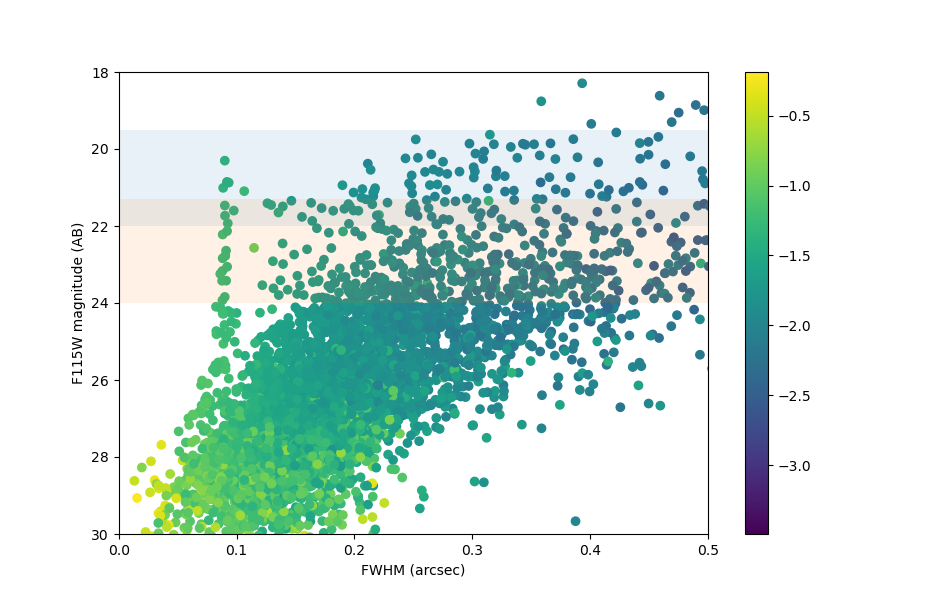

Text(0, 0.5, 'F115W magnitude (AB)')

In [15]:
fig = plt.figure(figsize=(9.5,6))
#plt.plot(mycat['fwhm'], mycat['f110w_mag'], 'o')
#plt.scatter(mycat['fwhm'], mycat['f110w_mag'], c=mycat['stel'])
c = np.log10(mycat['peak'] / mycat['flux'])
#plt.scatter(0.02*mycat['flux_radius'], mycat['f115w_mag'], c=c)
plt.scatter(mycat['fwhm'], mycat['f115w_mag'], c=c)
plt.fill_between([0, 1], 19.5, 22, alpha=0.1)
plt.fill_between([0, 1], 21.3, 24, alpha=0.1)
plt.colorbar()
#plt.colorbar(label='Stellarity')
plt.ylim(plt.ylim()[::-1])
#plt.xlim(0,1)
plt.xlim(0,0.5)
plt.ylim(30,18)
plt.xlabel('FWHM (arcsec)')
#plt.xlabel('Flux Radius (arcsec)')
plt.ylabel('F115W magnitude (AB)')

In [17]:
good_mag = between(21.3, mycat['f115w_mag'], 24)
compact = mycat['fwhm'] < 0.2

In [18]:
good = good_mag * compact

In [19]:
len(mycat[good]), len(mycat)

(81, 5378)

In [20]:
good_cat = mycat[good]

In [21]:
#infile = '/Users/dcoe/RELICS/data/whl0137-08/epoch4/color/whl0137-08_new_bright.png' # HST
infile = '/Users/dcoe/RELICS/data/whl0137-08/JWST/color/whl0137_v4_bright.png'
im = Image.open(infile)
imrgb = np.asarray(im)
imrgb = imrgb[::-1]

In [22]:
d_bright = 3.2 * u.arcsec
#within_box = distances < d_bright
#cat_coordinates[within_box]

In [33]:
pixel_scale = 0.02 * u.arcsec
d = d_bright / pixel_scale
d /= 2  # 3.2" x 3.2"
d = roundint(d)
d

80

In [24]:
good_cat.sort('fwhm')

<IPython.core.display.Javascript object>


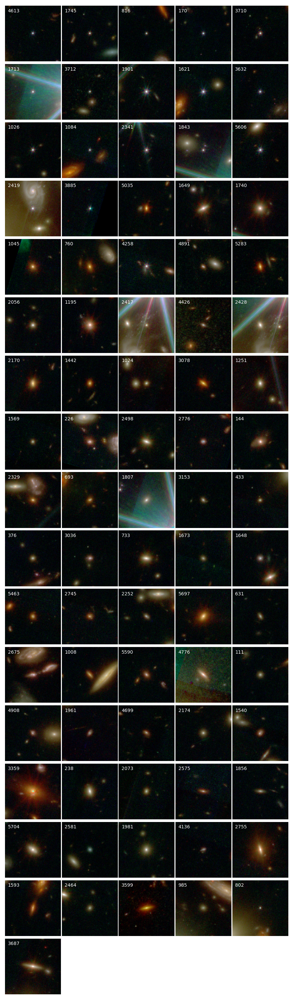

In [27]:
n = len(good_cat)
ncolumns = 5
nrows = np.ceil(n / ncolumns).astype(int)

fig, ax = plt.subplots(nrows, ncolumns, figsize=(8.8,30))
ax = ax.flatten()

for i in range(ncolumns*nrows):
    ax[i].axis('off')
    
for i in range(n):
    x = roundint(good_cat['x'][i])
    y = roundint(good_cat['y'][i])
    extent = x-d-0.5, x+d+0.5, y-d-0.5, y+d+0.5
    ax[i].imshow(imrgb[y-d:y+d+1,x-d:x+d+1], origin='lower', extent=extent)
    ax[i].text(x-0.9*d,y+0.9*d, good_cat['id'][i], va='top', color='white')
    
plt.tight_layout()
plt.subplots_adjust(hspace=0.02, wspace=0.02)

<IPython.core.display.Javascript object>


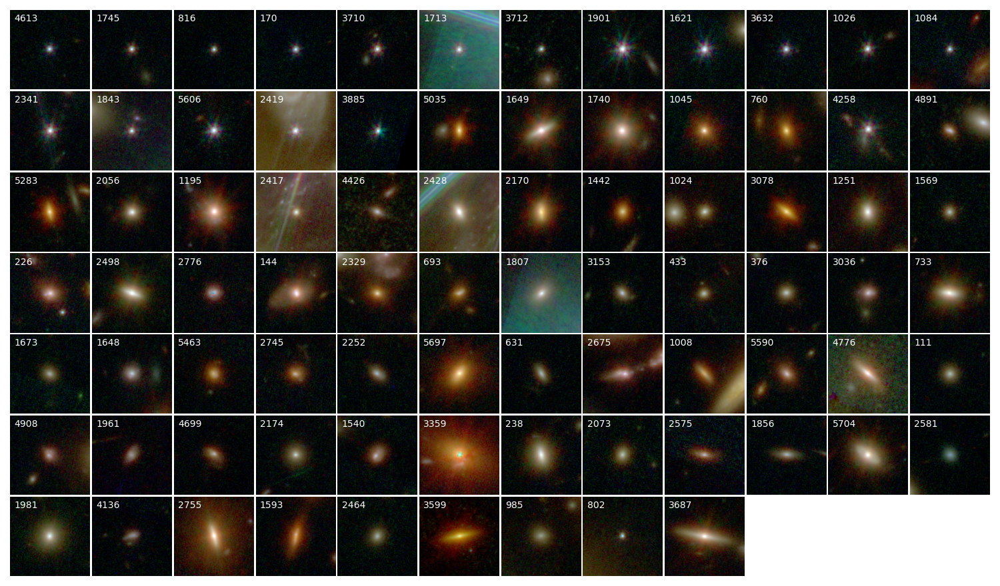

In [34]:
n = len(good_cat)
ncolumns = 12
nrows = np.ceil(n / ncolumns).astype(int)

fig, ax = plt.subplots(nrows, ncolumns, figsize=(15,8.8))
ax = ax.flatten()

for i in range(ncolumns*nrows):
    ax[i].axis('off')
    
for i in range(n):
    x = roundint(good_cat['x'][i])
    y = roundint(good_cat['y'][i])
    extent = x-d-0.5, x+d+0.5, y-d-0.5, y+d+0.5
    ax[i].imshow(imrgb[y-d:y+d+1,x-d:x+d+1], origin='lower', extent=extent)
    ax[i].text(x-0.9*d,y+0.9*d, good_cat['id'][i], va='top', color='white')
    
plt.tight_layout()
plt.subplots_adjust(hspace=0.02, wspace=0.02)

In [35]:
plt.savefig('whl0137_reference_object_candidates.png')

In [36]:
good_cat_coordinates = SkyCoord(ra=good_cat['ra']*u.degree, dec=good_cat['dec']*u.degree)

In [37]:
d_bright = 3.2 * u.arcsec  # avoid brighter comapnions within 3.2"
d_faint  = 0.3 * u.arcsec  # avoid fainter  companions within 0.3"

In [42]:
brightest_in_big_box = np.ones(n)
alone_in_small_box   = np.ones(n)
mag = good_cat['f115w_mag']

for i in range(len(good_cat)):
    obj_coordinates = SkyCoord(ra=good_cat['ra'][i]*u.degree, dec=good_cat['dec'][i]*u.degree)
    distances = obj_coordinates.separation(good_cat_coordinates)
    
    within_box = distances < d_bright
    within_box = within_box * (distances > 0)  # exclude self (distance = 0)
    idxcatalog = np.where(within_box)[0]
    if np.any(within_box):
        brightest_in_big_box[i] = mag[i] < np.min(mag[idxcatalog])
    
    within_small_box = distances < d_faint
    within_small_box = within_small_box * (distances > 0)  # exclude self (distance = 0)    
    if np.any(within_small_box):
        alone_in_small_box[i] = False
        
    #print(i, '%.2f' % mag[i], brightest_in_big_box[i], alone_in_small_box[i])

In [43]:
all_good = brightest_in_big_box * alone_in_small_box

In [44]:
np.sum(brightest_in_big_box), np.sum(alone_in_small_box), np.sum(all_good), len(all_good)

(79.0, 81.0, 79.0, 81)

In [ ]:
#good_ids = 4613, 1745, 816, 170, 3632, 3885, 1649, 2056, 1195, 2170, 1442, 3078, 1251, 1569, 2498, 2776, 144, 693, 733, 1673, 5697, 631, 111, 1961, 4699, 2174, 3359, 238, 2575, 5704, 1981, 2755, 3599, 3687

In [54]:
good_ids = 4613, 1745, 816, 170, 3710, 1901, 1621, 3632, 1026, 1084, 2341, 5606, 3885, 1649, 1740, 1045, 760, 4258, 2056, 1195, 4426, 2170, 1442, 3078, 1251, 1569, 2498, 2776, 144, 693, 3153, 433, 376, 3036, 733, 1673, 1648, 5463, 2745, 2252, 5697, 631, 5590, 4776, 111, 4908, 1961, 4699, 2174, 1540, 3359, 238, 2073, 2575, 1856, 5704, 2581, 1981, 4136, 2755, 1593, 2464, 3599, 985, 802, 3687

In [55]:
set(good_cat['id']) - set(good_ids)

{226,
 1008,
 1024,
 1713,
 1807,
 1843,
 2329,
 2417,
 2419,
 2428,
 2675,
 3712,
 4891,
 5035,
 5283}

In [56]:
set(good_ids) - set(good_cat['id'])  # Any typos?

set()

In [57]:
good_star_cat = catalog[np.array(good_ids) - 1]

In [58]:
good_star_cat

id,ra,dec,f090w_flux,f090w_fluxerr,f105w_flux,f105w_fluxerr,f110w_flux,f110w_fluxerr,f115w_flux,f115w_fluxerr,f125w_flux,f125w_fluxerr,f140w_flux,f140w_fluxerr,f150w_flux,f150w_fluxerr,f160w_flux,f160w_fluxerr,f200w_flux,f200w_fluxerr,f277w_flux,f277w_fluxerr,f356w_flux,f356w_fluxerr,f410m_flux,f410m_fluxerr,f435w_flux,f435w_fluxerr,f444w_flux,f444w_fluxerr,f475w_flux,f475w_fluxerr,f606w_flux,f606w_fluxerr,f814w_flux,f814w_fluxerr,z_spec,nusefilt,z_ml,z_ml_chi2,z_ml_risk,lc_min,lc_max,z_phot,z_phot_chi2,z_phot_risk,z_min_risk,min_risk,z_raw_chi2,raw_chi2,z025,z160,z500,z840,z975,restU,restU_err,restB,restB_err,restV,restV_err,restJ,restJ_err,dL,mass,sfr,Lv,LIR,energy_abs,Lu,Lj,L1400,L2800,LHa,LOIII,LHb,LOII,MLv,Av,lwAgeV,mass_p,sfr_p,Lv_p,LIR_p,energy_abs_p,Lu_p,Lj_p,L1400_p,L2800_p,LHa_p,LOIII_p,LHb_p,LOII_p,Av_p,ssfr_p,rest120,rest120_err,rest121,rest121_err,rest414,rest414_err,rest415,rest415_err,rest416,rest416_err,flux,peak,flux_radius,f090w_mag,f090w_magerr,f105w_mag,f105w_magerr,f110w_mag,f110w_magerr,f115w_mag,f115w_magerr,f125w_mag,f125w_magerr,f140w_mag,f140w_magerr,f150w_mag,f150w_magerr,f160w_mag,f160w_magerr,f200w_mag,f200w_magerr,f277w_mag,f277w_magerr,f356w_mag,f356w_magerr,f410m_mag,f410m_magerr,f435w_mag,f435w_magerr,f444w_mag,f444w_magerr,f475w_mag,f475w_magerr,f606w_mag,f606w_magerr,f814w_mag,f814w_magerr,x,y,fwhm
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,Mpc,solMass,solMass / yr,solLum,solLum,solLum,solLum,solLum,solLum,solLum,solLum,solLum,solLum,solLum,solMass / solLum,,Gyr,,,,,,,,,,,,,,,,,,,,,,,,,,uJy,uJy,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
int32,float64,float64,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float64,int64,float32,float32,float32,float64,float64,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64[5],float64[5],float64[5],float64[5],float64[5],float64[5],float64[5],float64[5],float64[5],float64[5],float64[5],float64[5],float64[5],float64[5],float64[5],float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float64,float64,float64,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float64,float64,float64
4613,24.322365,-8.405954,1.718,0.009,-99.000,-99.000,-99.000,-99.000,1.833,0.010,-99.000,-99.000,-99.000,-99.000,1.825,0.008,-99.000,-99.000,1.410,0.006,0.777,0.005,0.511,0.004,0.401,0.006,-99.000,-99.000,0.329,0.005,-99.000,-99.000,-99.000,-99.000,-99.000,-99.000,-1.0,8,-1.0,-1.0,-1.0,9022.9,44036.7,-1.0,-1.0,-1.0,0.01,-0.0,0.01,14.6224,0.0000,0.0000,0.0000,0.0000,0.0000,-99.000,0.000,-99.000,0.000,-99.000,0.000,-99.000,0.000,0.0e+00,-9.00e+29,-900000000000000046043660025856.000,-9.00e+29,-9.00e+29,-9.00e+29,-9.00e+29,-9.00e+29,-9.00e+29,-9.00e+29,-9.00e+29,-9.00e+29,-9.00e+29,-9.00e+29,-900000000000000046043660025856.00,-900000000000000046043660025856.00,-900000000000000046043660025856.00,-9.00e+29 .. -9.00e+29,-900000000000000046043660025856.000 .. -900000000000000046043660025856.000,-9.00e+29 .. -9.00e+29,-9.00e+29 .. -9.00e+29,-9.00e+29 .. -9.00e+29,-9.00e+29 .. -9.00e+29,-9.00e+29 .. -9.00e+29,-9.00e+29 .. -9.00e+29,-9.00e+29 .. -9.00e+29,-9.00e+29 .. -9.00e+29,-9.00e+29 .. -9.00e+29,-9.00e+29 .. -9.00e+29,-9.00e+29 .. -9.00e+29,-900000000000000046043660025856.00 .. -900000000000000046043660025856.00,-9.00e+29 .. -9.00e+29,-99.000,0.000,-99.000,0.000,-9

<IPython.core.display.Javascript object>


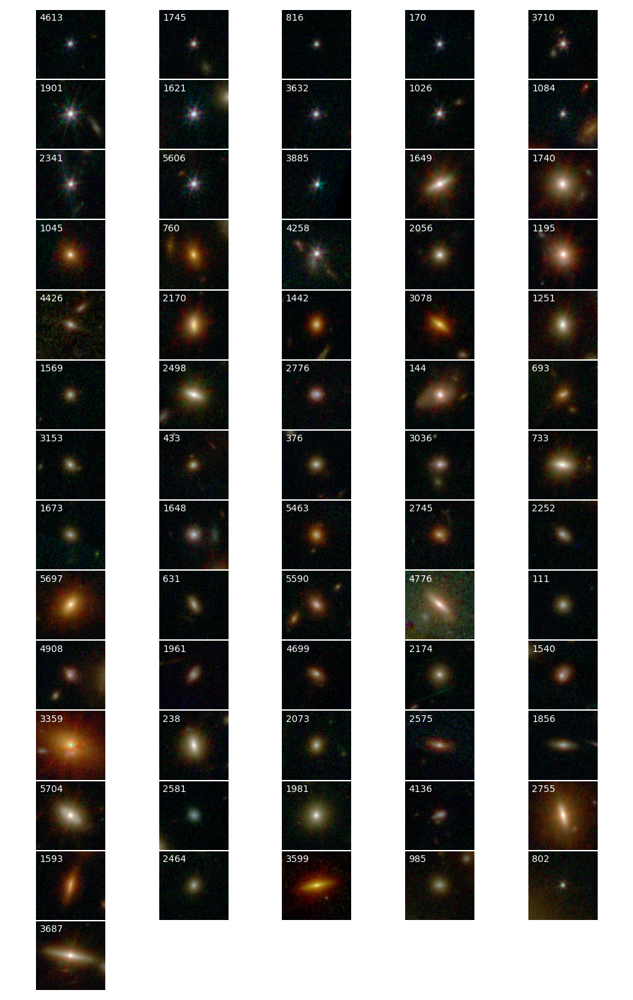

In [59]:
n = len(good_star_cat)
ncolumns = 5
nrows = np.ceil(n / ncolumns).astype(int)

fig, ax = plt.subplots(nrows, ncolumns, figsize=(9.5,15))
ax = ax.flatten()

for i in range(ncolumns*nrows):
    ax[i].axis('off')
    
for i in range(n):
    x = roundint(good_star_cat['x'][i])
    y = roundint(good_star_cat['y'][i])
    extent = x-d-0.5, x+d+0.5, y-d-0.5, y+d+0.5
    ax[i].imshow(imrgb[y-d:y+d+1,x-d:x+d+1], origin='lower', extent=extent)
    ax[i].text(x-0.9*d,y+0.9*d, good_star_cat['id'][i], va='top', color='white')
    
plt.tight_layout()
plt.subplots_adjust(hspace=0.02, wspace=0.02)

In [ ]:
len(good_star_cat)

<IPython.core.display.Javascript object>


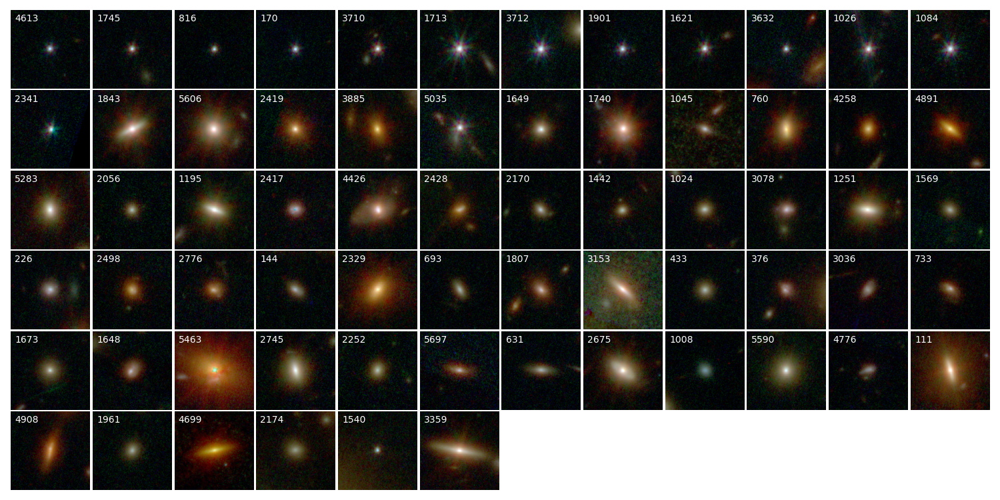

In [65]:
n = len(good_star_cat)
ncolumns = 12
nrows = np.ceil(n / ncolumns).astype(int)

fig, ax = plt.subplots(nrows, ncolumns, figsize=(15,7.5))
ax = ax.flatten()

for i in range(ncolumns*nrows):
    ax[i].axis('off')
    
for i in range(n):
    x = roundint(good_star_cat['x'][i])
    y = roundint(good_star_cat['y'][i])
    extent = x-d-0.5, x+d+0.5, y-d-0.5, y+d+0.5
    ax[i].imshow(imrgb[y-d:y+d+1,x-d:x+d+1], origin='lower', extent=extent)
    ax[i].text(x-0.9*d,y+0.9*d, good_cat['id'][i], va='top', color='white')
    
plt.tight_layout()
plt.subplots_adjust(hspace=0.02, wspace=0.02)

In [66]:
plt.savefig('whl0137_reference_objects_nircam.png')